# Independent assessment of the Spanish road system

In this project we are interested on evaluating the quality of the connections by road between different points of the Spanish geography.

We will analise separately the connection between the main cities in Spain, and the connection between all the towns and villages of the country with their closest main city.

In [80]:
#Import necessary modules
import numpy as np
import pandas as pd
from bs4 import BeautifulSoup
import requests #Makes web requests
import matplotlib.pyplot as plt
import math
import pickle
import folium
import folium.plugins
import branca
import branca.colormap as cm
from sklearn import preprocessing

# 1. Gather the raw data
To get the data we need, we will use several sources:
 - Scrape webpages, such as wikipedia, to get data from the main cities
 - Access to online databases, such as INE (National Statistics Institute of Spain)
 - Connect with external APIs, in particular, the trueway matrix API to evaluate road distances and trip times.

## Scrape webpages: Main cities
The Spanish geography is organized in regions, called "Comunidades Autónomas". Each of this reagios has a capital city.

We will create a dataframe with data such as Population and GDP per capita of those "Comunidades Autónomas" as well as the Latitude and Longitude of their capital cities.

In [2]:
#Get the source
source=requests.get('https://es.wikipedia.org/wiki/Anexo:Capitales_de_comunidades_aut%C3%B3nomas_de_Espa%C3%B1a').text

#html format
soup=BeautifulSoup(source,'lxml')

#Get the table
table=soup.find('table', class_='wikitable')

#We get a list with the headers of the columns and prepare the dimension of the list with the lists of the data of each column
headers=[]
cols_data=[]
for th in table.tr.find_all('th'):
    headers.append(th.text.rstrip())
    cols_data.append([])
    
#We iterate to get a list for each column values
for tr in table.find_all('tr'): #Goes through all the <tr> tags
    i=0
    for td in tr.find_all('td'):
        try:
            cols_data[i].append(td.text.rstrip())#rstrip to remove the final \n
        except:
            cols_data[i].append("Error")
        finally:
            i=i+1
            
comunidad_autonoma_raw=[]

poblacion=[]
latitud=[]
longitud=[]
# #Keep comunidad autónoma, población and coordenadas.
# #Comunidad autónoma
for i in range(len(cols_data[0])):
    comunidad_autonoma_raw.append(cols_data[0][i].split('\xa0')[0])

#Get rid of the islands
excluidos=[]

for i in range(len(cols_data[0])):
    if comunidad_autonoma_raw[i] in ['Islas Baleares', 'Canarias', 'Ceuta', 'Melilla']:
        excluidos.append(i)
        
comunidad_autonoma=[]

for j in [i for i in range(len(comunidad_autonoma_raw)) if i not in excluidos]:
    comunidad_autonoma.append(comunidad_autonoma_raw[j])
pibpercapita=[18470,27403,22046,22513,19681,22727,29936,17262,22497,23555,33809,20585,30914,22055,33088]
comunidad_autonoma=['Andalucía', 'Aragón', 'Asturias', 'Cantabria', 'Castilla La Mancha', 'Castilla León', 'Catalunya', 'Extremadura', 'Galicia', 'La Rioja', 'Madrid', 'Murcia', 'Navarra', 'Valencia', 'País Vasco']

# #Población

# for i in range(len(cols_data[3])):
for i in [j for j in range(len(cols_data[3])) if j not in excluidos]:
    poblacion.append(cols_data[3][i].split(' ')[0].replace('.',''))
    
#Coordenadas
strcoord=''
origen=[]

for i in [j for j in range(len(cols_data[5])) if j not in excluidos]:
    #They have the format 41°38′N 4°43′O / 41.633, -4.717
    derecha=cols_data[5][i].split('/ ')[1]
    lat=derecha.split(', ')[0]
    long=derecha.split(', ')[1]
    latitud.append(lat)
    longitud.append(long)

    #I will use an API to evaluate the time and distance between all points

    #The API we will use requires an input:
    #'lat'+'%2C'+'long'+'%3B'+lat'+%2C'+'long'+'%3B'+'lat'+'%2C'+'long' y así sucesivamente
    strcoord=strcoord+'%3B'+str(lat)+'%2C'+str(long)
    
    #También quiero una lista con cada uno de ellos para el origen:
    #'lat'+'%2C'+'long'
    origen.append(str(lat)+'%2C'+str(long))
    
    
#Get rid of the first '%3B'
strcoord=strcoord[3:]

#Get rid of extrange characters
strcoord=strcoord.replace('﻿','')
for i in range(len(origen)):
    origen[i]=origen[i].replace('\ufeff','')
for i in range(len(latitud)):
    latitud[i]=latitud[i].replace('\ufeff','')
    longitud[i]=longitud[i].replace('\ufeff','')


In [3]:
# Arrange the data to create a df


data = {'Comunidad Autonoma':comunidad_autonoma, 'Population':poblacion, 'Latitude':latitud, 'Longitude':longitud, 'GDP per capita':pibpercapita} 
  
# Create DataFrame 
df = pd.DataFrame(data).sort_values(by=['Comunidad Autonoma'])
#df.reset_index(drop = True, inplace = True)
df.set_index('Comunidad Autonoma',inplace=True)
df

,Population,Latitude,Longitude,GDP per capita
Comunidad Autonoma,,,,
Andalucía,8409000,37.367,-5.983,18470
Aragón,680895,41.6563497,-0.8765662,27403
Asturias,224090,43.36000,-5.84500,22046
Cantabria,178465,43.450,-3.800,22513
Castilla La Mancha,83741,39.8565278,-4.0251111,19681
Castilla León,414281,41.633,-4.717,22727
Catalunya,1620323,41.383,2.167,29936
Extremadura,60119,38.900,-6.333,17262
Galicia,96405,42.867,-8.550,22497


# External database: All regions
In the second part of the analysis, we won't just focus on the main cities, but we will analyse all the Spanish peninsula towns and villages, which account to close to 8,000.

We get that information from an external database based on the national institute of statistics data

In [4]:
#Import downloaded file
dftodos = pd.read_excel (r'listado-longitud-latitud-municipios-espana.xls')
dftodos

,Comunidad,Provincia,Población,Latitud,Longitud,Altitud,Habitantes,Hombres,Mujeres
0,Andalucía,Almería,Abla,37.14114,-2.780104,871.16840,1504,783,721
1,Andalucía,Almería,Abrucena,37.13305,-2.797098,976.93870,1341,682,659
2,Andalucía,Almería,Adra,36.74807,-3.022522,10.97898,24373,12338,12035
3,Andalucía,Almería,Albánchez,37.28710,-2.181163,481.31230,815,422,393
4,Andalucía,Almería,Alboloduy,37.03319,-2.621750,388.43460,674,334,340
...,...,...,...,...,...,...,...,...,...
7950,Valencia,Valencia/València,Xeresa,39.00910,-0.217992,34.05847,2221,1124,1097
7951,Valencia,Valencia/València,Xirivella,39.46669,-0.427794,35.01973,30691,15474,15217
7952,Valencia,Valencia/València,Yátova,39.38500,-0.808174,441.81140,2199,1140,1059
7953,Valencia,Valencia/València,Yesa (La),39.49916,-0.426125,52.28455,260,141,119


# API Connection
To get the navigation information, we will connect to the Trueway Matrix API.

We define a function that takes as arguments the latitude and longitude of the origin and destination points concatenated in strings separated by commas and semicolumns un unichar.

I gives as output a text file with the distance by road between the origin and de destination points in meters, and the time in seconds that it takes to drive that road by car


In [5]:
def matrixAPI(destino,origen):
    
    url = "https://trueway-matrix.p.rapidapi.com/CalculateDrivingMatrix"

    querystring = {"destinations":destino,"origins":origen}

    headers = {
        'x-rapidapi-host': "trueway-matrix.p.rapidapi.com",
        'x-rapidapi-key': "*****HIDDEN*****"
    }

    response = requests.request("GET", url, headers=headers, params=querystring)
    
    return response

# 2. Process the data: get new features
Once we have set the origin of our data, we want to analyse it to get new features that can be used to asses the quality of the different roads of the Spanish peninsula, and determine how good is the connectivity of the different areas.

To do that, we will first analise the connectivity between the different capital cities, and then the conectivity of the different towns and villages to their capital city.

In particular, we are interested in obtaining:
 - The average speed of the roads
 - The road distance / straight distance ratio, which is a number >= 1 that compares de distance between two points as a straight line and by road.

# 2.1 Connectivity between capital cities

We will now call the matrix API to get the distance and time of travel of each pair of capital cities

In [6]:
# Initialize the lists in which we will store the result
distancias=[] #Will store the distances
tiempos=[] #Will store the times
#Call the API in a loop for each capital city as origin and the rest of the capital cities as destination
for elemento in origen:
    response=matrixAPI(strcoord,elemento)
    #Limpiar response
    rawrespuesta=response.text

    #Clean the results to get a list of numbers
    lista=rawrespuesta.split(',')
    number=''
    listalimpia=[]
    for element in lista:
        number=''
        for digit in element:
            if digit.isdigit():
                number=number+digit
        listalimpia.append(int(number))
    distancias.append(listalimpia[0:int(len(listalimpia)/2)])
    tiempos.append(listalimpia[int(len(listalimpia)/2):])


Once we have distances and times, we convert them to numpy arrays to perform operations.

### Average speed

In [7]:
ard=np.array(distancias)#metros
art=np.array(tiempos) #segundos
np.seterr(divide='ignore')
arv=np.divide(ard, art) #m/s
arv=arv/1000*3600 #k/h

C:\Users\acall\anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


The following confussion matrix displays in colors the average speed of the roads that leave from the city in the y axis and arrive to the city in the x axis.

([<matplotlib.axis.YTick at 0x2a5851df2c8>,
 <a list of 15 Text yticklabel objects>)

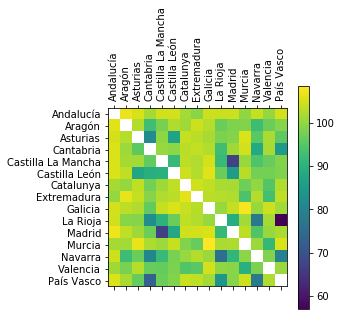

In [8]:
plt.matshow(arv)
plt.colorbar()
plt.xticks(np.arange(0,15), comunidad_autonoma, rotation='vertical')
plt.yticks(np.arange(0,15), comunidad_autonoma)

### Road distance / Straight line distance ratio

Now we will evaluate the distance ratio.
For that, we define a function that trakes two position coordinates and returns the distance between them meassured as a line over the surface of the Earth.

In [9]:
#Transform latitud longitud in distance
def CoordToDist(lato,longo,latd,longd):
    Rtierra=6371#km
    distancia=Rtierra*math.sqrt(((lato-latd)*math.pi/180)**2+((longo-longd)*math.pi/180)**2)
    return distancia

We call the function for all the pairs of coordinates and store it in a numpy array: ardrecta

In [10]:
distrecta=[]
for i in range(len(comunidad_autonoma)):
    distempo=[]
    for j in range(len(comunidad_autonoma)):
        a=CoordToDist(float(latitud[i]),float(longitud[i]),float(latitud[j]),float(longitud[j]))
        distempo.append(a)
    distrecta.append(distempo)

ardrecta=np.array(distrecta)

The following confussion matrix displays in colors the distance ratio of the trips that leave from the city in the y axis and arrive to the city in the x axis.

C:\Users\acall\anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


([<matplotlib.axis.YTick at 0x2a584cf5288>,
 <a list of 15 Text yticklabel objects>)

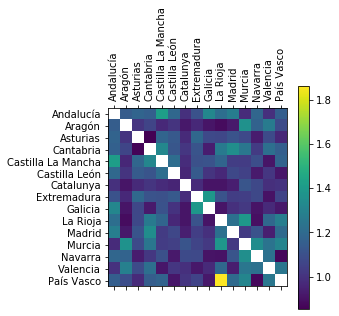

In [11]:
arRatioDistancias=np.divide(ard,ardrecta)/1000
plt.matshow(arRatioDistancias)
plt.colorbar()
plt.xticks(np.arange(0,15), comunidad_autonoma, rotation='vertical')
plt.yticks(np.arange(0,15), comunidad_autonoma)

# Gather results

We average the value for both of the return trips (we can see in the plot that on average those two values don't differ much.

In [13]:
#Media por fila y media por columna
#Fijando el origen:
orifijor=np.nanmean(arRatioDistancias, axis=1)
orifijov=np.nanmean(arv, axis=1)
#Fijando el destino
destfijor=np.nanmean(arRatioDistancias, axis=0)
destfijov=np.nanmean(arv, axis=0)
for i in range(len(orifijor)):
    if orifijor[i]<1:
        orifijor[i]=1/orifijor[i]
    if destfijor[i]<1:
        destfijor[i]=1/destfijor[i]

ordesfijor=(orifijor+destfijor)/2
ordesfijov=(orifijov+destfijov)/2


We add our results to the dataframe to observe it.

In [14]:
poblacion=[int(habitantes) for habitantes in poblacion]
data2 = {'Comunidad Autonoma':comunidad_autonoma, 'Population':poblacion, 'GDP per capita':pibpercapita , 'Ratio road/distance':ordesfijor, 'average speed of roads':ordesfijov}
  
# Create DataFrame 
df2 = pd.DataFrame(data2).sort_values(by=['Comunidad Autonoma'])
df2.reset_index(drop = True, inplace = True)
df2

,Comunidad Autonoma,Population,GDP per capita,Ratio road/distance,average speed of roads
0,Andalucía,8409000,18470,1.167775,103.972775
1,Aragón,680895,27403,1.051073,100.705957
2,Asturias,224090,22046,1.061217,99.619665
3,Cantabria,178465,22513,1.132714,95.596480
4,Castilla La Mancha,83741,19681,1.124226,96.554913
5,Castilla León,414281,22727,1.051858,98.353837
6,Catalunya,1620323,29936,1.016623,101.887530
7,Extremadura,60119,17262,1.089043,102.033133
8,Galicia,96405,22497,1.027165,103.471848
9,La Rioja,153402,23555,1.129471,94.620098


### Linear correlation among columns

In [15]:
#We can find the correlation among columns.
df2.corr(method ='pearson') 

,Population,GDP per capita,Ratio road/distance,average speed of roads
Population,1.000000,-0.074450,0.350450,0.415908
GDP per capita,-0.074450,1.000000,-0.349775,-0.421695
Ratio road/distance,0.350450,-0.349775,1.000000,-0.171504
average speed of roads,0.415908,-0.421695,-0.171504,1.000000


In [99]:
# Normalize both ratio and avg speed
ratioinv=1/df2['Ratio road/distance']
ratioinv=ratioinv/max(ratioinv)
avs=df2['average speed of roads']
avs=avs/max(avs)
cauto=df2['Comunidad Autonoma']


data3 = {'Comunidad Autonoma':cauto,'Distance ratio':df2['Ratio road/distance'],'avg speed':df2['average speed of roads'], 'Normalised inv ratio':ratioinv, 'Normalised avg speed':avs}
  
# Create DataFrame 
df3 = pd.DataFrame(data3)
df3['Mark']= df3['Normalised inv ratio']*df3['Normalised avg speed']
df3.sort_values(by=['Mark'],inplace=True,ascending=False)
df3.reset_index(drop=True, inplace=True)
df3

,Comunidad Autonoma,Distance ratio,avg speed,Normalised inv ratio,Normalised avg speed,Mark
0,Galicia,1.027165,103.471848,0.989737,0.995182,0.984968
1,Catalunya,1.016623,101.887530,1.000000,0.979944,0.979944
2,Aragón,1.051073,100.705957,0.967224,0.968580,0.936834
3,Asturias,1.061217,99.619665,0.957978,0.958132,0.917870
4,Extremadura,1.089043,102.033133,0.933501,0.981345,0.916086
5,Castilla León,1.051858,98.353837,0.966502,0.945958,0.914270
6,Valencia,1.089710,98.657462,0.932930,0.948878,0.885236
7,Madrid,1.089939,97.104272,0.932734,0.933939,0.871117
8,Andalucía,1.167775,103.972775,0.870564,1.000000,0.870564
9,Navarra,1.062272,94.328492,0.957027,0.907242,0.868255


# 2.1 Connectivity between capital cities

We will now call the matrix API to get the distance and time of travel for every town and village in Spain


### IMPORTANT NOTE:
All this procedure calls the same process as before but for the 8,000 villages in Spain.

Since it takes some time to get all this information from the API, I run it once and store the results in my computer, so I don't have to run it every time.

All this block is commented, and the variables are load with the pickle library below the block.

In [18]:
# distpueblos=[]
# tiempopueblos=[]
# distrectapueblos=[]

# for comunidad, df_comunidad in dftodos.groupby('Comunidad'):
#     latdes=float(df.loc[comunidad,'Latitude'])
#     longdes=float(df.loc[comunidad,'Longitude'])
#     destino=str(latdes)+'%2C'+str(longdes)
    
#     distempo=[]
#     distpueblostempo=[]
#     tiempopueblostempo=[]
    
#     for index, row in df_comunidad.iterrows():
#         latori=float(row['Latitud'])
#         longori=float(row['Longitud'])
#         origen=str(latori)+'%2C'+str(longori)
                
#         a=CoordToDist(latori,longori,latdes,longdes)
#         distempo.append(a)       
        
#         disytiempo=matrixAPI(destino,origen)
#         #Limpiar response
#         rawrespuesta=disytiempo.text

#         #Clean the results to get a list of numbers
#         lista=rawrespuesta.split(',')
#         number=''
#         listalimpia=[]
#         for element in lista:
#             number=''
#             for digit in element:
#                 if digit.isdigit():
#                     number=number+digit
#             listalimpia.append(int(number))
#         #1 numero cada
#         distpueblostempo.append(listalimpia[0])
#         tiempopueblostempo.append(listalimpia[1])
    
#     distrectapueblos.append(distempo)
#     print(distempo)
#     print(distrectapueblos)
#     distpueblos.append(distpueblostempo)
#     tiempopueblos.append(tiempopueblostempo)

In [19]:
# #PAra manejarlos mejor, vamos a convertirlos en listas de arrays
# lardp=[]
# lartp=[]
# lardrp=[]

# larvp=[]
# larRatio=[]

# lRatioCCAA=[]
# larvpCCAA=[]

# for i in range(len(distrectapueblos)):
#     lardp.append(np.array(distpueblos[i]))
#     lartp.append(np.array(tiempopueblos[i]))
#     lardrp.append(np.array(distrectapueblos[i]))


#     #Calculamos la velocidad y el ratio
#     larvp.append(np.divide(lardp[i], lartp[i])/1000*3600) #m/s
#     larRatio.append(np.divide(lardp[i],lardrp[i])/1000)
    
#     #Medias por comunidades autónomas
#     lRatioCCAA.append(larRatio[i].mean())
#     larvpCCAA.append(larvp[i].mean())


In [108]:
# #Guardar las variables
# with open('objs.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
#     pickle.dump([lardp, lartp, lardrp, larvp, larRatio, lRatioCCAA, larvpCCAA], f)

# Getting back the objects:
with open('objs.pkl','rb') as f:  # Python 3: open(..., 'rb')
    lardp, lartp, lardrp, larvp, larRatio, lRatioCCAA, larvpCCAA = pickle.load(f)

#All the variables loaded are lists of arrays
#Each array of the lists corresponds to the results for all the villages of a given Comunidad Autónoma

# lartp: times
# lardp: distances
# lardrp: straight distance

# larvp: average speed
# larRatio: distance ratio

# lRatioCCAA: average distance ratio for the villages in a Comunidad Autónoma
# larvpCCAA: average speed of the road for the villages in a Comunidad Autónoma

## Add all the data to the dataframe

In [23]:
#We take the lists of arrays and flatten them (take lists in lists and make them just one list)
flatten = lambda l: [item for sublist in l for item in sublist]
flatvp=flatten(larvp)
flatRp=flatten(larRatio)
flatRp = [1/ratio if ratio<1 else ratio for ratio in flatRp]

In [24]:
dftodos['Ratio']=flatRp
dftodos['avg speed']=flatvp
dftodos

,Comunidad,Provincia,Población,Latitud,Longitud,Altitud,Habitantes,Hombres,Mujeres,Ratio,avg speed
0,Andalucía,Almería,Abla,37.14114,-2.780104,871.16840,1504,783,721,1.020974,99.533091
1,Andalucía,Almería,Abrucena,37.13305,-2.797098,976.93870,1341,682,659,1.016553,99.330809
2,Andalucía,Almería,Adra,36.74807,-3.022522,10.97898,24373,12338,12035,1.050242,96.683214
3,Andalucía,Almería,Albánchez,37.28710,-2.181163,481.31230,815,422,393,1.015996,95.125731
4,Andalucía,Almería,Alboloduy,37.03319,-2.621750,388.43460,674,334,340,1.006146,98.164740
...,...,...,...,...,...,...,...,...,...,...,...
7950,Valencia,Valencia/València,Xeresa,39.00910,-0.217992,34.05847,2221,1124,1097,1.196796,73.842072
7951,Valencia,Valencia/València,Xirivella,39.46669,-0.427794,35.01973,30691,15474,15217,1.009177,20.302994
7952,Valencia,Valencia/València,Yátova,39.38500,-0.808174,441.81140,2199,1140,1059,1.073097,62.543488
7953,Valencia,Valencia/València,Yesa (La),39.49916,-0.426125,52.28455,260,141,119,1.237697,24.010118


### Linear correlation among columns

In [78]:
#We can find the correlation among columns.
dftodos.corr(method ='pearson') 

,Latitud,Longitud,Altitud,Habitantes,Hombres,Mujeres,Ratio,avg speed
Latitud,1.000000,0.089144,0.054392,-0.044569,-0.047126,-0.042242,0.086717,-0.134053
Longitud,0.089144,1.000000,-0.171809,0.010867,0.012274,0.009591,0.087698,-0.228873
Altitud,0.054392,-0.171809,1.000000,-0.104624,-0.108483,-0.101101,-0.088797,0.316951
Habitantes,-0.044569,0.010867,-0.104624,1.000000,0.999839,0.999868,0.088517,-0.151190
Hombres,-0.047126,0.012274,-0.108483,0.999839,1.000000,0.999417,0.090158,-0.153794
Mujeres,-0.042242,0.009591,-0.101101,0.999868,0.999417,1.000000,0.087007,-0.148790
Ratio,0.086717,0.087698,-0.088797,0.088517,0.090158,0.087007,1.000000,-0.290366
avg speed,-0.134053,-0.228873,0.316951,-0.151190,-0.153794,-0.148790,-0.290366,1.000000


In [116]:

Rpnorm=[1/x for x in lRatioCCAA]
Rpnorm=[x/max(Rpnorm) for x in lRatioCCAA]
avgpnorm=larvpCCAA/max(larvpCCAA)
ccaa=[]
for comunidad, df in dftodos.groupby('Comunidad'):
    ccaa.append(comunidad)
data4={'Comunidad autónoma':ccaa, 'Ratio':lRatioCCAA, 'avg speed':larvpCCAA,'norm inv Ratio':Rpnorm, 'norm speed':avgpnorm}
# Create DataFrame 
df4 = pd.DataFrame(data4)
df4['Mark']= df4['norm inv Ratio']*df4['norm speed']
df4.sort_values(by=['Mark'],inplace=True,ascending=False)
df4.reset_index(drop=True, inplace=True)
df4

,Comunidad autónoma,Ratio,avg speed,norm inv Ratio,norm speed,Mark
0,Extremadura,1.179595,83.977968,1.256695,0.957027,1.202691
1,Galicia,1.178737,83.795579,1.255781,0.954949,1.199206
2,Aragón,1.175917,83.958242,1.252777,0.956802,1.198660
3,Andalucía,1.091762,86.501342,1.163121,0.985784,1.146586
4,Castilla León,1.065361,87.748785,1.134994,1.000000,1.134994
5,País Vasco,1.280485,70.134526,1.364179,0.799265,1.090341
6,Valencia,1.256281,70.584280,1.338393,0.804390,1.076590
7,Asturias,1.230082,71.766022,1.310481,0.817858,1.071787
8,Catalunya,1.157771,76.161291,1.233445,0.867947,1.070565
9,Castilla La Mancha,1.067705,82.513091,1.137492,0.940333,1.069621


# Graphical analysis
In this section we produce the necessary plots to analyse the data.

Please, refer to the report to read the conclusions.

([<matplotlib.axis.XTick at 0x2a586a61848>,
 <a list of 15 Text xticklabel objects>)

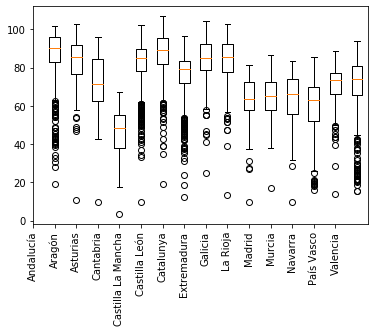

In [27]:
comunidades=[]
for comunidad, df_comunidad in dftodos.groupby('Comunidad'):
    comunidades.append(comunidad)
    
#Box plot para cada ccaa con la velocidad de las carreteras
#Box plot para cada ccaa con el ratio de las carreteras
plt.boxplot(larvp)
plt.xticks(np.arange(0,15), comunidades, rotation='vertical')

([<matplotlib.axis.XTick at 0x2a586c04e88>,
 <a list of 15 Text xticklabel objects>)

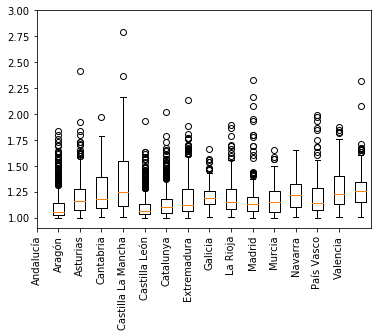

In [28]:
lRatiotrampa=[]
for array in larRatio:
    Ratiotrampa=[ratio if ratio>1 else 1/ratio for ratio in array]
    lRatiotrampa.append(Ratiotrampa)

plt.boxplot(lRatiotrampa)
plt.ylim(0.9, 3)
plt.xticks(np.arange(0,15), comunidades, rotation='vertical')

In [29]:
#distpueblos, tiempopueblos, distrectapueblos son listas
#dentro de cada uno hay una lista por cada ccaa
#voy a convertir cada una de esas listas es un array y repetir lo de antes para cada comunidad autónoma
#de ahí obtengo el dato de comunicación de los pueblos con la capital de la comunidad autónoma
#dibujo tooooodos los pueblos en el mapa con un marcador de color en función del ratio distancia carretera / distancia
#escribo sobre los resultados en función del pib per cápita de la región
#además puedo pintar el ratio como función de número de habitantes del pueblo


In [30]:
#Poner en un mapa todos los municipios con un punto del color del ratio
#dibujar una scatter plot con ratio en cada comunidad frente a pib per cápita
#dibujar un scatter de ratio frente a número de habitantes

# Map display

In [ ]:
colormap = cm.LinearColormap(colors['red','green'],index=[50,120])#,vmin=90,vmax=100)
map=folium.Map(location=[40.433,-3.683],zoom_start=6)

lat=list(dftodos['Latitud'][0:5])
lon = list(dftodos['Longitud'][0:5])
avgspeed=list(float(d))


In [73]:

colormap = cm.LinearColormap(colors=['green','red'],vmin=1,vmax=1.6)#index=[50,100.0])#

map = folium.Map(location=[40.433,-3.683], zoom_start=6)


lat = list(dftodos['Latitud'])
lon = list(dftodos['Longitud'])
avgspeed = list(dftodos['Ratio'])

for lat,lon,avgsp in zip(lat, lon, avgspeed):
                folium.Circle(
                    location=[lat, lon],
                    radius=5,
                    fill=True,
                    color=colormap(avgsp),
                    #fill_opacity=0.7
                ).add_to(map)

map.add_child(colormap)

display(map)

In [75]:
# A más distancia, más velocidad media, así que habría que dividir entre la distancia al cuadrado
colormap = cm.LinearColormap(colors=['red','green'],vmin=50,vmax=100)#index=[50,100.0])#

map = folium.Map(location=[40.433,-3.683], zoom_start=6)


lat = list(dftodos['Latitud'])
lon = list(dftodos['Longitud'])
avgspeed = list(dftodos['avg speed'])

for lat,lon,avgsp in zip(lat, lon, avgspeed):
                folium.Circle(
                    location=[lat, lon],
                    radius=5,
                    fill=True,
                    color=colormap(avgsp),
                    #fill_opacity=0.7
                ).add_to(map)

map.add_child(colormap)

display(map)

# FIN